# **Natural Language Processing with Disaster Tweets**

https://www.kaggle.com/c/nlp-getting-started

**Context**
Twitter has become an important communication channel in times of emergency.
The ubiquitousness of smartphones enables people to announce an emergency they’re observing in real-time. Because of this, more agencies are interested in programatically monitoring Twitter (i.e. disaster relief organizations and news agencies).

In this competition, you’re challenged to build a machine learning model that predicts which Tweets are about real disasters and which one’s aren’t. You’ll have access to a dataset of 10,000 tweets that were hand classified.

# 1. Imports & Loading

In [1]:
# Usual tools

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from pprint import pprint
import pickle
import seaborn as sns
sns.set(style='white', context='notebook', palette='deep') 
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.style as style
style.use('fivethirtyeight')
import math
import missingno
from bioinfokit.analys import stat
import warnings 
warnings.filterwarnings('ignore')
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.io as pio
from PIL import Image

# Text processing 

import collections
from collections import Counter
from unidecode import unidecode
import re
import string
from spellchecker import SpellChecker
import contractions

# NLP & LDA

import spacy
from spacy.lang.en.stop_words import STOP_WORDS
from spacy.lang.en import English
nlp = spacy.load('en_core_web_sm')
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
nltk.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from gensim.utils import simple_preprocess
from gensim import corpora
import gensim
import gensim.corpora as corpora
from gensim.corpora import Dictionary
from gensim.models.coherencemodel import CoherenceModel
from gensim.models.ldamodel import LdaModel
import pyLDAvis
import pyLDAvis.gensim
from wordcloud import WordCloud
from textblob import TextBlob

# Topic analysis

from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer

# sklearn : Preprocessing 

from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler, LabelEncoder
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer, IterativeImputer
from sklearn.compose import ColumnTransformer
from sklearn import feature_extraction, linear_model, model_selection, preprocessing

# Model Selection & evaluation

from sklearn.linear_model import LinearRegression, Ridge, Lasso, LogisticRegression, BayesianRidge
from sklearn.ensemble import AdaBoostRegressor, RandomForestRegressor, BaggingRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, precision_score, accuracy_score, f1_score, confusion_matrix, roc_auc_score, roc_curve, recall_score, classification_report
from shapash.explainer.smart_explainer import SmartExplainer
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold, RepeatedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.utils import resample
from sklearn.ensemble import BaggingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.linear_model import SGDClassifier, ElasticNet
from xgboost import XGBClassifier

# Tensorflow

import tensorflow as tf
import tensorflow_hub as hub # USE
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input,Dense
from tensorflow.keras.callbacks import ModelCheckpoint
import tensorflow_addons as tfa


c:\Users\LN\AppData\Local\Programs\Python\Python310\lib\site-packages\past\builtins\misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib and slated for removal in Python 3.12; see the module's documentation for alternative uses
  from imp import reload
c:\Users\LN\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\rcmod.py:82: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) >= "3.0":
c:\Users\LN\AppData\Local\Programs\Python\Python310\lib\site-packages\setuptools\_distutils\version.py:346: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
Importing display from IPython

In [2]:
# Load datasets

train_df = pd.read_csv("train.csv", encoding = "ISO8859-1")
print(f'Nb of rows in TRAIN : {len(train_df)}')


Nb of rows in TRAIN : 7613


In [3]:
# Dealing with encoding

train_df['text'] = train_df['text'].apply(unidecode)
train_df['keyword'] = [unidecode(x) if x is pd.notnull else x for x in train_df['keyword'] ]

In [4]:
print(f'Nb of duplicated tweets deleted from the dataset : {sum(train_df["text"].duplicated())}')
train_df = train_df.drop_duplicates(subset = ['text']).reset_index()

Nb of duplicated tweets deleted from the dataset : 110


# 2. Exploratory Data Analysis

## 2.1. Target variable

The dataset counts 4305 (57.38%) Tweets not signaling a disaster against 3198 (42.62%) Tweets signaling one. 


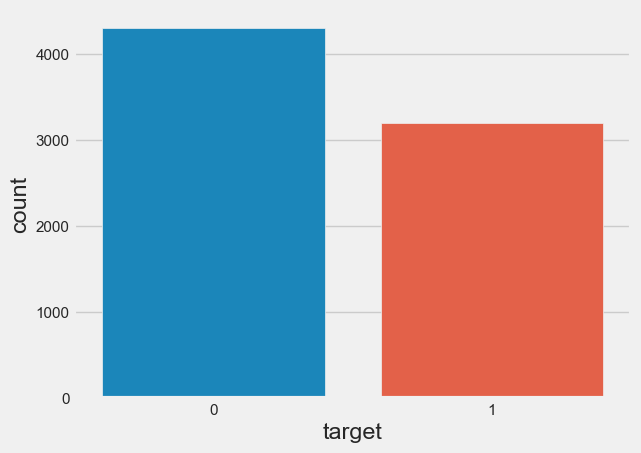

In [5]:
print(f'The dataset counts {train_df.target.value_counts()[0]} ({round(train_df.target.value_counts()[0]/len(train_df)*100, 2)}%) Tweets not signaling a disaster against {train_df.target.value_counts()[1]} ({round(train_df.target.value_counts()[1]/len(train_df)*100, 2)}%) Tweets signaling one. ')
sns.countplot(train_df.target);

Data are quite balanced regarding the target to predict. 

## 2.2. Location variable

In [6]:
train_df.location.value_counts()

USA                        104
New York                    71
United States               50
London                      45
Canada                      29
                          ... 
Trackside California         1
he/him or she/her (ask)      1
Some pum pum                 1
Paulton, England             1
Lincoln                      1
Name: location, Length: 3327, dtype: int64

In [7]:
print(f"We count {sum(train_df['location'].isna())} Tweets with missing location - around {round(sum(train_df['location'].isna())/len(train_df)*100,2)}% of the dataset")

We count 2482 Tweets with missing location - around 33.08% of the dataset


The proportion of missing location is quite high. To this percent, we also have to add the tweets which are only located thanks to the country or the continent, and the tweets voluntariliry hiding its location (Asgard, Mars, In the shadow, Somewhere only we know ...). 
Thus, we will not use this variable. It would have had a gread value to predict the fact that a tweet signals or not a disaster (crossing location and time to see the co occurrence of several tweets in the same area in a short time). 

## 2.3. Keywords Variable 

In [8]:
train_df.keyword.value_counts()

fatalities               45
deluge                   42
armageddon               42
damage                   41
body%20bags              41
                         ..
forest%20fire            19
epicentre                12
threat                   11
inundation               10
radiation%20emergency     9
Name: keyword, Length: 221, dtype: int64

In [9]:
print(f'Nb of missing data in the Keywords variable : {sum(train_df["keyword"].isna())} ({round(sum(train_df["keyword"].isna()) / len(train_df) * 100, 0)}%)')

Nb of missing data in the Keywords variable : 56 (1.0%)


## 2.4. Extraction of additional descriptive features

In [10]:
# Writing features
train_df['Nb_char'] = train_df['text'].str.len()
train_df['Nb_word'] = train_df['text'].str.split().apply(len)
train_df['Avg_word_len'] = train_df['text'].str.split().apply(lambda x : [len(i) for i in x]).map(lambda x : np.mean(x))
train_df = train_df.assign(Nb_Exclam = [x.count("!") for x in train_df.text])
train_df = train_df.assign(Nb_Upper = [len([elem for elem in x if elem.isupper()]) for x in train_df.text])

# Presence and number of #
train_df = train_df.assign(Hashtag = ["#" in x for x in train_df.text])
train_df = train_df.assign(Nb_Hashtag = [x.count("#") for x in train_df.text])

# Presence and number of @
train_df = train_df.assign(At = ["@" in x for x in train_df.text])
train_df = train_df.assign(Nb_At = [x.count("@") for x in train_df.text])

# Presence and number of urls
train_df = train_df.assign(Link = ["http" in x or "www" in x for x in train_df.text])
train_df = train_df.assign(Nb_link = [x.count("http") + x.count("www") for x in train_df.text])

### What about the quantitative features ?

In [11]:
quant_var = ['Nb_char', 'Nb_word', 'Avg_word_len', 'Nb_Exclam', 'Nb_Upper', 'Nb_Hashtag', 'Nb_At', 'Nb_link']
for var in quant_var : 
    res = stat()
    formula = 'target ~ C(' + var + ')'
    res.anova_stat(df = train_df, res_var = 'target', anova_model = formula)
    print('Effect on {} - p value  = {}'.format(var, round(res.anova_summary['PR(>F)'][0],3)))

Effect on Nb_char - p value  = 0.0
Effect on Nb_word - p value  = 0.0
Effect on Avg_word_len - p value  = 0.0
Effect on Nb_Exclam - p value  = 0.0
Effect on Nb_Upper - p value  = 0.0
Effect on Nb_Hashtag - p value  = 0.0
Effect on Nb_At - p value  = 0.0
Effect on Nb_link - p value  = 0.0


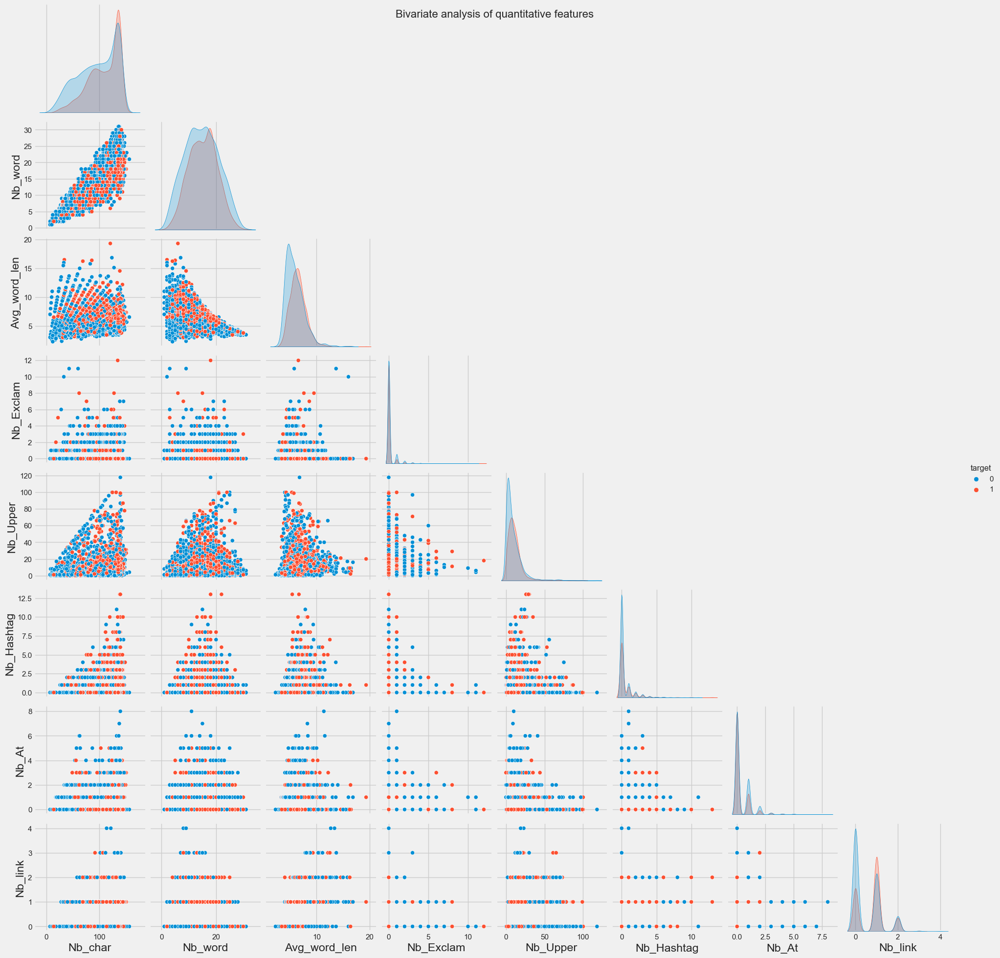

In [12]:
quant_var = ['target', 'Nb_char', 'Nb_word', 'Avg_word_len', 'Nb_Exclam', 'Nb_Upper', 'Nb_Hashtag', 'Nb_At', 'Nb_link']
sns.pairplot(train_df[quant_var], hue = 'target', corner = True);
plt.suptitle('Bivariate analysis of quantitative features', size = 16);

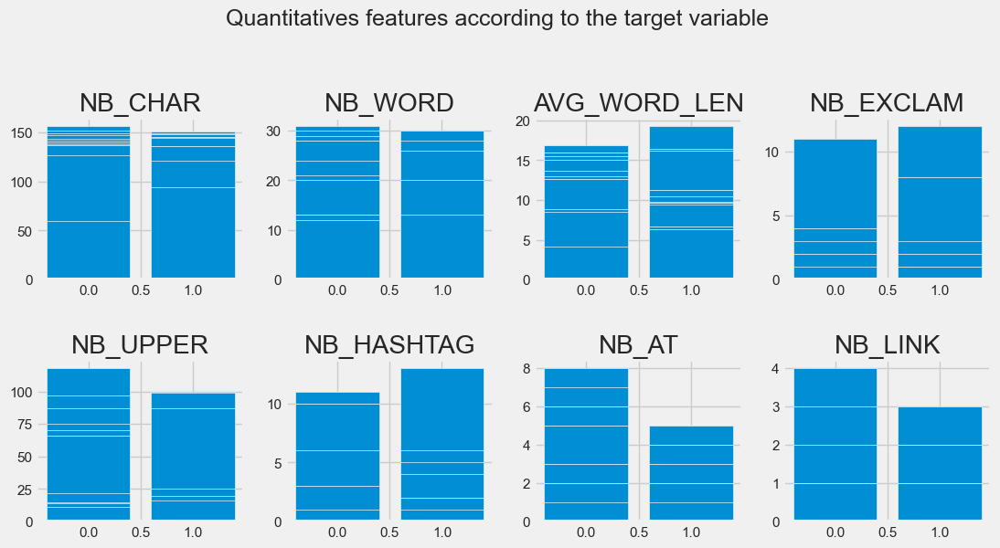

In [13]:
quant_var = ['Nb_char', 'Nb_word', 'Avg_word_len', 'Nb_Exclam', 'Nb_Upper', 'Nb_Hashtag', 'Nb_At', 'Nb_link']
    
plt.figure(figsize = (12, 12))
plt.subplots_adjust(hspace = 0.5)
plt.suptitle("Quantitatives features according to the target variable", fontsize = 18)

for n, ticker in enumerate(quant_var):
    
    ax = plt.subplot(4, 4, n + 1) # add a new subplot iteratively

    plt.bar(train_df.target, train_df[ticker])

    ax.set_title(ticker.upper())
    ax.set_xlabel("")

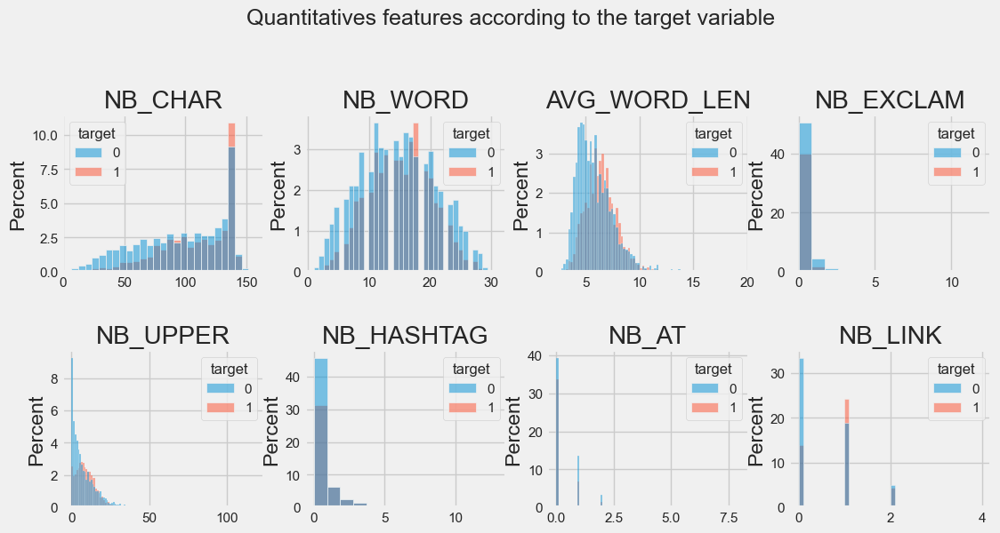

In [14]:
quant_var = ['Nb_char', 'Nb_word', 'Avg_word_len', 'Nb_Exclam', 'Nb_Upper', 'Nb_Hashtag', 'Nb_At', 'Nb_link']
    
plt.figure(figsize = (12, 12))
plt.subplots_adjust(hspace = 0.5)
plt.suptitle("Quantitatives features according to the target variable", fontsize = 18)

for n, ticker in enumerate(quant_var):
    
    ax = plt.subplot(4, 4, n + 1) # add a new subplot iteratively

    sns.histplot(train_df, x = ticker, stat = 'percent', hue = "target");

    ax.set_title(ticker.upper())
    ax.set_xlabel("")

### What about the presence / absence features ?

In [15]:
qual_var = ['Hashtag', 'At', 'Link']
for var in qual_var : 
    res = stat()
    formula = 'target ~ C(' + var + ')'
    res.anova_stat(df = train_df, res_var = 'target', anova_model = formula)
    print('Effect on {} - p value  = {}'.format(var, round(res.anova_summary['PR(>F)'][0],3)))

Effect on Hashtag - p value  = 0.0
Effect on At - p value  = 0.0
Effect on Link - p value  = 0.0


<AxesSubplot:xlabel='target'>

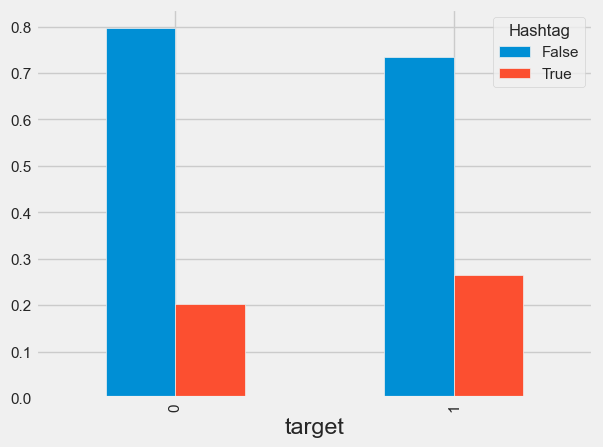

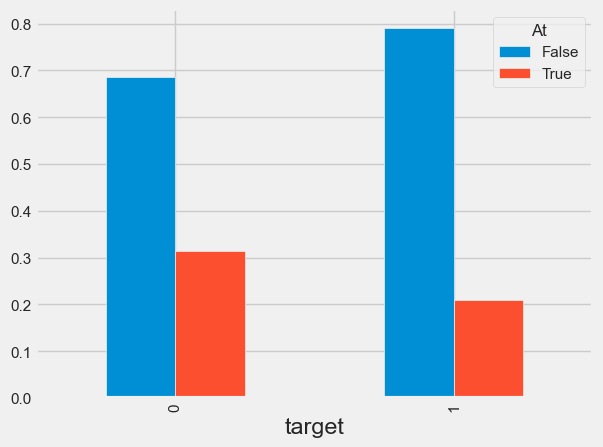

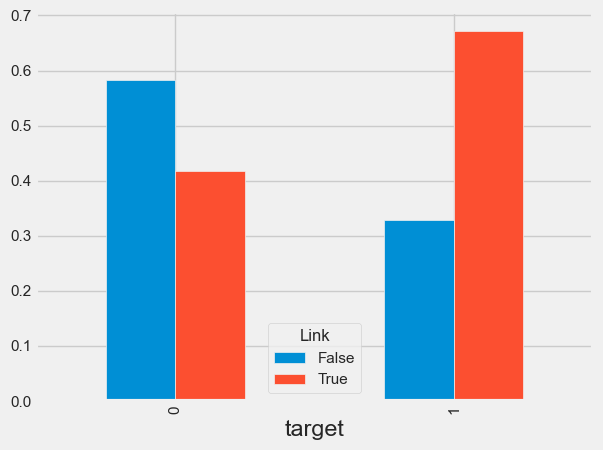

In [16]:
pd.crosstab(index = train_df['target'], columns = train_df['Hashtag'], normalize = 'index').plot.bar()
pd.crosstab(index = train_df['target'], columns = train_df['At'], normalize = 'index').plot.bar()
pd.crosstab(index = train_df['target'], columns = train_df['Link'], normalize = 'index').plot.bar()

# 3. Preprocessing

In [17]:
# Lower casing

train_df['cleaned'] = train_df['text'].apply(lambda x: x.lower())

# Replace &amp; with &

train_df['cleaned'] = train_df['cleaned'].str.replace('&amp;','')

# Expanding English Contractions

train_df['cleaned'] = train_df['cleaned'].apply(lambda x : contractions.fix(x))

# Remove http / https URLs

train_df['cleaned'] = train_df['cleaned'].str.replace(r'http\S+', '', regex = True)
train_df['cleaned'] = train_df['cleaned'].apply(lambda x : re.sub(r'www\.[^\s]+', '', x)) 

# Remove emails

train_df['cleaned'] = train_df['cleaned'].apply(lambda x : re.sub(r'\S*@\S*\s?', '', x))

# Remove digits and words containing digits 

train_df['cleaned'] = train_df['cleaned'].apply(lambda x: re.sub('\w*\d\w*','', x))

# Remove usernames @

train_df['cleaned'] = train_df['cleaned'].apply(lambda x : re.sub(r'@[^ ]+', '', x))

# Character normalization (repeated letters such as yesssss)

train_df['cleaned'] = train_df['cleaned'].apply(lambda x : re.sub(r'([A-Za-z])\1{2,}', r'\1', x))

# Remove special characters

def tweet_cleaner(tweet):
    tweet = re.sub(r"%20", " ", tweet)
    tweet = re.sub(r"%", " ", tweet)
    tweet = re.sub(r"'", " ", tweet)
    tweet = re.sub(r"\x89û_", " ", tweet)
    tweet = re.sub(r"\x89ûò", " ", tweet)
    tweet = re.sub(r"re\x89û_", " ", tweet)
    tweet = re.sub(r"\x89û", " ", tweet)
    tweet = re.sub(r"\x89Û", " ", tweet)
    tweet = re.sub(r"re\x89Û", "re ", tweet)
    tweet = re.sub(r"re\x89û", "re ", tweet)
    tweet = re.sub(r"\x89ûª", "'", tweet)
    tweet = re.sub(r"\x89û", " ", tweet)
    tweet = re.sub(r"\x89ûò", " ", tweet)
    tweet = re.sub(r"\x89Û_", "", tweet)
    tweet = re.sub(r"\x89ÛÒ", "", tweet)
    tweet = re.sub(r"\x89ÛÓ", "", tweet)
    tweet = re.sub(r"\x89ÛÏ", "", tweet)
    tweet = re.sub(r"\x89Û÷", "", tweet)
    tweet = re.sub(r"\x89Ûª", "", tweet)
    tweet = re.sub(r"\x89Û\x9d", "", tweet)
    tweet = re.sub(r"å_", "", tweet)
    tweet = re.sub(r"\x89Û¢", "", tweet)
    tweet = re.sub(r"\x89Û¢åÊ", "", tweet)
    tweet = re.sub(r"åÊ", "", tweet)
    tweet = re.sub(r"åÈ", "", tweet)  
    tweet = re.sub(r"Ì©", "e", tweet)
    tweet = re.sub(r"å¨", "", tweet)
    tweet = re.sub(r"åÇ", "", tweet)
    tweet = re.sub(r"åÀ", "", tweet)
    tweet = re.sub(r"â", "", tweet)
    tweet = re.sub(r"ã", "", tweet)
    return tweet

train_df['cleaned'] = train_df['cleaned'].apply(lambda x: tweet_cleaner(x))

# Remove punctuation 

train_df['cleaned'] = train_df['cleaned'].apply(lambda x: re.sub('[%s]' % re.escape(string.punctuation), '', x))

# Remove double spaces

train_df['cleaned'] = train_df['cleaned'].apply(lambda x : re.sub(r'  ', ' ', x))

# Remove \n

train_df['cleaned'] = train_df['cleaned'].apply(lambda x : re.sub(r'\n', '', x))

# Correct spelling (https://pypi.org/project/pyspellchecker/)

spell = SpellChecker()
for i in range(len(train_df)) : 
    text = train_df['cleaned'][i]
    corrected = []
    misspelled = spell.unknown(text.split())
    if len(misspelled) > 0 :
        for word in text.split():
            if word in misspelled :
                if spell.correction(word) is None :
                    corrected.append(word)
                else :
                    corrected.append(spell.correction(word))
            else:
                corrected.append(word)
        train_df['cleaned'][i] = " ".join(corrected)


In [18]:
# Tokenization & Lemmatization (removing stopwords)

tokens = []
lemma = []
pos = []

for doc in nlp.pipe(train_df["cleaned"].astype('unicode').values, batch_size=50):
    tokens.append([n.text for n in doc if ((n.lemma_ not in STOP_WORDS) and (len(n.text) >= 2))])
    lemma.append([n.lemma_ for n in doc if ((n.lemma_ not in STOP_WORDS) and (len(n.lemma_) >= 2))])

train_df['desc_tokens'] = tokens
train_df['desc_lemma'] = lemma
train_df['desc_lemma_text'] = train_df['desc_lemma'].map(lambda x: " ".join(s for s in x if len(s) >= 2))

# 4. Content description

## 4.1. Top n-grams

In [19]:
def get_top_ngram(corpus, n = None):
    vec = CountVectorizer(ngram_range = (n, n)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis = 0) 
    words_freq = [(word, sum_words[0, idx]) 
                  for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse =  True)
    return words_freq[:10]

[Text(0.5, 1.0, 'Top 2-grams for Disaster Tweets')]

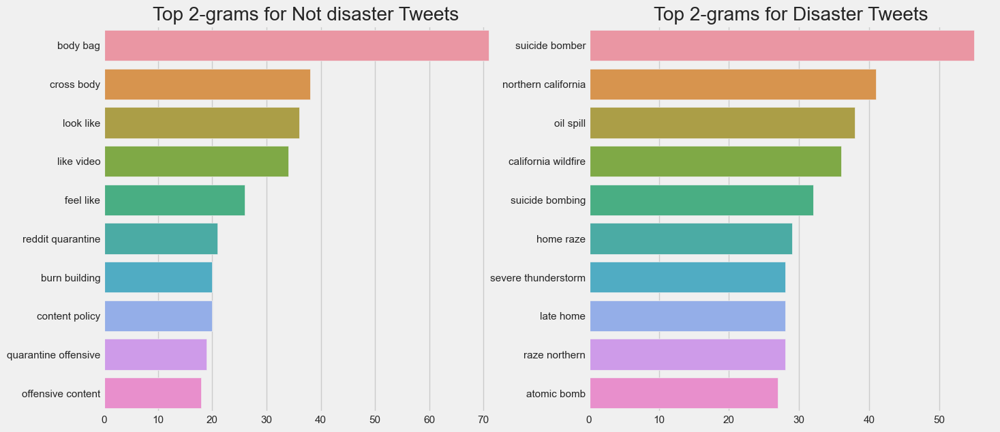

In [20]:
top_n_bigrams_0 = get_top_ngram(train_df[(train_df.target == 0)]['desc_lemma_text'], 2)[:10]
x0, y0 = map(list, zip(*top_n_bigrams_0))
top_n_bigrams_1 = get_top_ngram(train_df[(train_df.target == 1)]['desc_lemma_text'], 2)[:10]
x1, y1 = map(list, zip(*top_n_bigrams_1))

fig, axs = plt.subplots(ncols = 2, figsize = (15, 7))
sns.barplot(x = y0, y = x0, ax = axs[0]).set(title = 'Top 2-grams for Not disaster Tweets')
sns.barplot(x = y1, y = x1, ax = axs[1]).set(title = 'Top 2-grams for Disaster Tweets')

## 4.2. Wordclouds

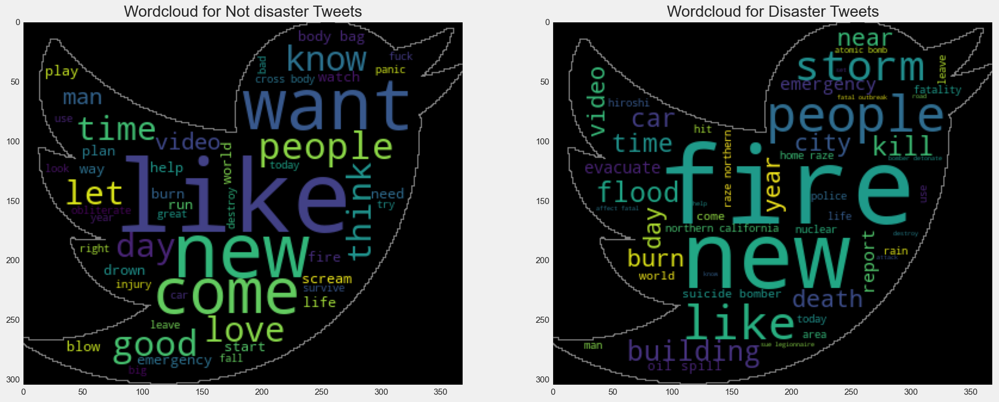

In [21]:
text_merge_clean_0 = ''
for j in range(0, len(train_df[train_df['target'] == 0])):
    text_merge_clean_0 += str(train_df[train_df['target'] == 0]['desc_lemma_text'].iloc[j])
text_merge_clean_1 = ''
for j in range(0, len(train_df[train_df['target'] == 1])):
    text_merge_clean_1 += str(train_df[train_df['target'] == 1]['desc_lemma_text'].iloc[j])

mask = np.array(Image.open("twitter.png"))
fig = plt.figure(figsize = (20, 10))
ax = fig.add_subplot(1,2,1)
plt.subplot(1,2,1).set_title('Wordcloud for Not disaster Tweets')
ax.imshow(WordCloud(mask = mask, contour_width = 1, contour_color = "grey", min_font_size = 3, max_words = 50, width = 1600, height = 800, stopwords = STOP_WORDS).generate(text_merge_clean_0))
plt.grid(None)
ax = fig.add_subplot(1,2,2)
plt.subplot(1,2,2).set_title('Wordcloud for Disaster Tweets')
ax.imshow(WordCloud(mask = mask, contour_width = 1, contour_color = "grey", min_font_size = 3, max_words = 50, width = 1600, height = 800, stopwords = STOP_WORDS).generate(text_merge_clean_1))
plt.grid(None)

## 4.3. Sentiment analysis

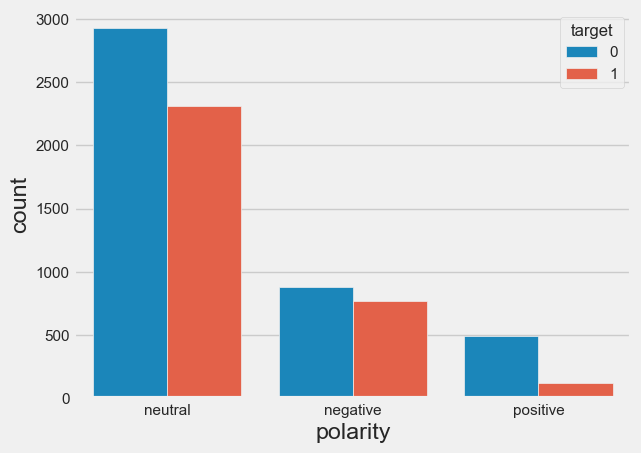

In [22]:
sid = SentimentIntensityAnalyzer()

def get_vader_score(sent):
    # Polarity score returns dictionary
    ss = sid.polarity_scores(sent)
    #return ss
    return np.argmax(list(ss.values())[:-1])

train_df['polarity'] = train_df['desc_lemma_text'].map(lambda x: get_vader_score(x))

train_df['polarity'] = train_df['polarity'].replace({0 : 'negative', 1 : 'neutral', 2 : 'positive'})

sns.countplot(x = 'polarity', hue = 'target', data = train_df);

In [23]:
set(train_df[(train_df['target'] == 1) & (train_df['polarity'] == 'positive')]['text'])

{'#OilandGas Exploration Takes Seismic Shift in #Gabon to #Somalia http://t.co/oHHolJ9vEV via @business',
 '18 bovines rescued 3 smugglersAY=Anabbed http://t.co/E7fn5G5rUu',
 '8-5-2015 - 4:30 P.M. - Progress Being Made on Boise Forest Fires\nhttp://t.co/6o1mgMGHgt http://t.co/wTPO6elRZd',
 "@BLutz10 People aren't rioting because justice has been served and that murderer is behind bars. Simple! No justice=no peace Justice=peace.",
 "@BenKin97 @Mili_5499 remember when u were up like 4-0 and blew it in one game? U probs don't because it was before the kings won the cup",
 '@BillMcCabe  sky looks clear.... No smoke from the fires. Enjoy your time in Tahoe. One of my favorite places!',
 '@BubblyCuteOne ?????????? ok ok okayyyyyy Ima act right ....bout to get this blizzard tho',
 '@Cali74142290 lol natural disaster/hospital crisis something is needed to get rid of some cast members....',
 '@ChristieC733 please support this Please cosponsor S. 928 and support aid for sick and injured 9/11 res

Reading as these tweets, we can question some of the coding. For ex

my favorite lady came to our volunteer meeting hopefully joining her youth collision and i am excite 
ok peace I hope I fall off a cliff along with my dignity
:) well I think that sounds like a fine plan where little derailment is possible so I applaud you :)

## 4.4. Topic modelling

The aim here is to classify the Tweets content according to its topic. The technique the most affordable is an unsupervised technique because it would be too time consuming to manually label all topics represented in each tweet. Topic Modeling is an unsupervised learning method as it automatically groups words without any predefined labels / classifications. 

With LDA, each document (Tweet) is considered as a collection of topics in a certain proportion and each topic is a collection of keywords in a certain proportion. 

Doing so, a topic is no more than a collection of frequent keywords (representatives). It is the user's job to interpret the topic meaning thanks to all the keywords. 

Topic coherence measures the average similarity between top words having the highest weights in a topic (= distance between the top words). We will use this score to choose the best model parameters. 

In [24]:
# LDA model training - choosing optimal nb of topics

id2word = corpora.Dictionary(train_df['desc_lemma']) 
texts = train_df['desc_lemma'] 
corpus = [id2word.doc2bow(text) for text in texts]

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary<0 unique tokens: []>
INFO:gensim.corpora.dictionary:built Dictionary<10466 unique tokens: ['allah', 'deed', 'earthquake', 'forgive', 'reason']...> from 7503 documents (total 56207 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary<10466 unique tokens: ['allah', 'deed', 'earthquake', 'forgive', 'reason']...> from 7503 documents (total 56207 corpus positions)", 'datetime': '2022-11-19T20:14:33.495966', 'gensim': '4.2.0', 'python': '3.10.5 (tags/v3.10.5:f377153, Jun  6 2022, 16:14:13) [MSC v.1929 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.19041-SP0', 'event': 'created'}


In [25]:
coherence_values = []
model_list = []
for num_topics in range(1,20,4):
    model = gensim.models.LdaMulticore(random_state = 60, 
                                       corpus = corpus,
                                       id2word = id2word,
                                       num_topics = num_topics)
    model_list.append(model)
    coherence_values.append(CoherenceModel(model = model, texts = train_df['desc_lemma'], dictionary = id2word, coherence = 'c_v').get_coherence()) 

INFO:gensim.models.ldamodel:using symmetric alpha at 1.0
INFO:gensim.models.ldamodel:using symmetric eta at 1.0
INFO:gensim.models.ldamodel:using serial LDA version on this node
INFO:gensim.models.ldamulticore:running online LDA training, 1 topics, 1 passes over the supplied corpus of 7503 documents, updating every 14000 documents, evaluating every ~7503 documents, iterating 50x with a convergence threshold of 0.001000
INFO:gensim.models.ldamulticore:training LDA model using 7 processes
INFO:gensim.models.ldamulticore:PROGRESS: pass 0, dispatched chunk #0 = documents up to #2000/7503, outstanding queue size 1
INFO:gensim.models.ldamulticore:PROGRESS: pass 0, dispatched chunk #1 = documents up to #4000/7503, outstanding queue size 2
INFO:gensim.models.ldamulticore:PROGRESS: pass 0, dispatched chunk #2 = documents up to #6000/7503, outstanding queue size 3
INFO:gensim.models.ldamulticore:PROGRESS: pass 0, dispatched chunk #3 = documents up to #7503/7503, outstanding queue size 4
INFO:gen

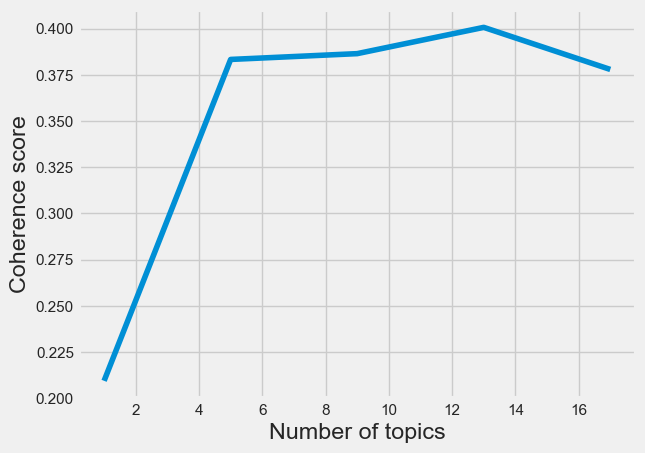

In [26]:
plt.plot(range(1,20,4), coherence_values)
plt.xlabel("Number of topics")
plt.ylabel("Coherence score")
plt.show() 

In [27]:
# LDA model training - choosing optimal hyperparameters

a_values = ['symmetric', 'asymmetric']
e_values = ['symmetric', 'auto']
coherence_values = []
model_list = []
for alpha in a_values:
    for eta in e_values :
        model = gensim.models.LdaMulticore(random_state = 60, 
                                            corpus = corpus,
                                            id2word = id2word,
                                            num_topics = 7, 
                                            alpha = alpha, 
                                            eta = eta)
        model_list.append(model)
        coherence_values.append(CoherenceModel(model = model, texts = train_df['desc_lemma'], dictionary = id2word, coherence = 'c_v').get_coherence()) 

INFO:gensim.models.ldamodel:using symmetric alpha at 0.14285714285714285
INFO:gensim.models.ldamodel:using symmetric eta at 0.14285714285714285
INFO:gensim.models.ldamodel:using serial LDA version on this node
INFO:gensim.models.ldamulticore:running online LDA training, 7 topics, 1 passes over the supplied corpus of 7503 documents, updating every 14000 documents, evaluating every ~7503 documents, iterating 50x with a convergence threshold of 0.001000
INFO:gensim.models.ldamulticore:training LDA model using 7 processes
INFO:gensim.models.ldamulticore:PROGRESS: pass 0, dispatched chunk #0 = documents up to #2000/7503, outstanding queue size 1
INFO:gensim.models.ldamulticore:PROGRESS: pass 0, dispatched chunk #1 = documents up to #4000/7503, outstanding queue size 2
INFO:gensim.models.ldamulticore:PROGRESS: pass 0, dispatched chunk #2 = documents up to #6000/7503, outstanding queue size 3
INFO:gensim.models.ldamulticore:PROGRESS: pass 0, dispatched chunk #3 = documents up to #7503/7503, o

In [28]:
i = 0
for alpha in a_values:
    for eta in a_values :
        print("Model with Alpha =", alpha, "and Eta =", eta, "has Coherence value of", round(coherence_values[i], 3))
        i += 1

Model with Alpha = symmetric and Eta = symmetric has Coherence value of 0.392
Model with Alpha = symmetric and Eta = asymmetric has Coherence value of 0.392
Model with Alpha = asymmetric and Eta = symmetric has Coherence value of 0.362
Model with Alpha = asymmetric and Eta = asymmetric has Coherence value of 0.362


In [29]:
# Final LDA model training

lda_model = gensim.models.LdaMulticore(random_state = 60, 
                                       corpus = corpus,
                                       id2word = id2word,
                                       num_topics = 7, 
                                       alpha = 'asymmetric', 
                                       eta = 'symmetric')

pprint(lda_model.print_topics())

doc_lda = lda_model[corpus]

INFO:gensim.models.ldamodel:using asymmetric alpha [0.26219156, 0.19027454, 0.14931786, 0.12287004, 0.104381524, 0.090729296, 0.080235206]
INFO:gensim.models.ldamodel:using symmetric eta at 0.14285714285714285
INFO:gensim.models.ldamodel:using serial LDA version on this node
INFO:gensim.models.ldamulticore:running online LDA training, 7 topics, 1 passes over the supplied corpus of 7503 documents, updating every 14000 documents, evaluating every ~7503 documents, iterating 50x with a convergence threshold of 0.001000
INFO:gensim.models.ldamulticore:training LDA model using 7 processes
INFO:gensim.models.ldamulticore:PROGRESS: pass 0, dispatched chunk #0 = documents up to #2000/7503, outstanding queue size 1
INFO:gensim.models.ldamulticore:PROGRESS: pass 0, dispatched chunk #1 = documents up to #4000/7503, outstanding queue size 2
INFO:gensim.models.ldamulticore:PROGRESS: pass 0, dispatched chunk #2 = documents up to #6000/7503, outstanding queue size 3
INFO:gensim.models.ldamulticore:PRO

[(0,
  '0.005*"fire" + 0.004*"like" + 0.004*"new" + 0.004*"emergency" + '
  '0.004*"disaster" + 0.004*"family" + 0.004*"come" + 0.003*"crash" + '
  '0.003*"train" + 0.003*"let"'),
 (1,
  '0.008*"people" + 0.007*"news" + 0.006*"flood" + 0.005*"like" + 0.005*"kill" '
  '+ 0.004*"long" + 0.004*"love" + 0.003*"burn" + 0.003*"collapse" + '
  '0.003*"watch"'),
 (2,
  '0.015*"like" + 0.011*"fire" + 0.006*"burn" + 0.005*"video" + 0.005*"bomb" + '
  '0.005*"bag" + 0.005*"body" + 0.005*"suicide" + 0.005*"year" + 0.004*"look"'),
 (3,
  '0.007*"news" + 0.007*"fire" + 0.005*"california" + 0.005*"man" + '
  '0.005*"new" + 0.004*"burn" + 0.004*"day" + 0.004*"war" + 0.004*"police" + '
  '0.003*"bad"'),
 (4,
  '0.005*"like" + 0.004*"people" + 0.004*"big" + 0.004*"man" + 0.004*"oil" + '
  '0.004*"spill" + 0.003*"storm" + 0.003*"august" + 0.003*"look" + '
  '0.003*"severe"'),
 (5,
  '0.009*"police" + 0.006*"new" + 0.006*"fire" + 0.006*"kill" + 0.004*"wound" '
  '+ 0.004*"storm" + 0.004*"suicide" + 0.004*

Each topic is represented by an equation in which each keyword is weighted (importance) to indicate how much it contributes to the topic. How to interpret this kind of output ?

Topic 0 is a represented as 0.008*"like" + 0.006*"fire" + 0.004*"day" + 0.004*"people" + 0.004*"news" + 0.003*"crash" + 0.003*"video" + 0.003*"love" + 0.003*"kill" + '0.003*"come".

So this topic is represented by the top 2 keywords are like, fire. 

In [30]:
# Compute Perplexity
print('\nPerplexity: ', lda_model.log_perplexity(corpus)) 

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model = lda_model, texts = train_df['desc_lemma'], dictionary = id2word, coherence = 'c_v')
print('\nCoherence Score: ', coherence_model_lda.get_coherence())

INFO:gensim.models.ldamodel:-8.801 per-word bound, 446.0 perplexity estimate based on a held-out corpus of 7503 documents with 56207 words
INFO:gensim.topic_coherence.probability_estimation:using ParallelWordOccurrenceAccumulator<processes=7, batch_size=64> to estimate probabilities from sliding windows



Perplexity:  -8.800920226568433


INFO:gensim.topic_coherence.text_analysis:7 accumulators retrieved from output queue
INFO:gensim.topic_coherence.text_analysis:accumulated word occurrence stats for 7221 virtual documents



Coherence Score:  0.36212438572029804


In [31]:
# Analyzing LDA model results

pyLDAvis.enable_notebook()

LDAvis = pyLDAvis.gensim.prepare(lda_model, corpus, id2word)
pyLDAvis.display(LDAvis)

We observe 2 main topics (T1 and T2), close to each others in the left of PC1 with a third topic (T3). 
- T1 : like, fire
- T2 : like, fire
- T3 : family, new, legionnaire

At the opposite side of PC1 , some little topic 
- T6 : like, wreck
- T7 : reddit, quarantine

The topics T4 and T5 are contrasted along PC2.
- T4 : new, crash
- T5 : fire, water

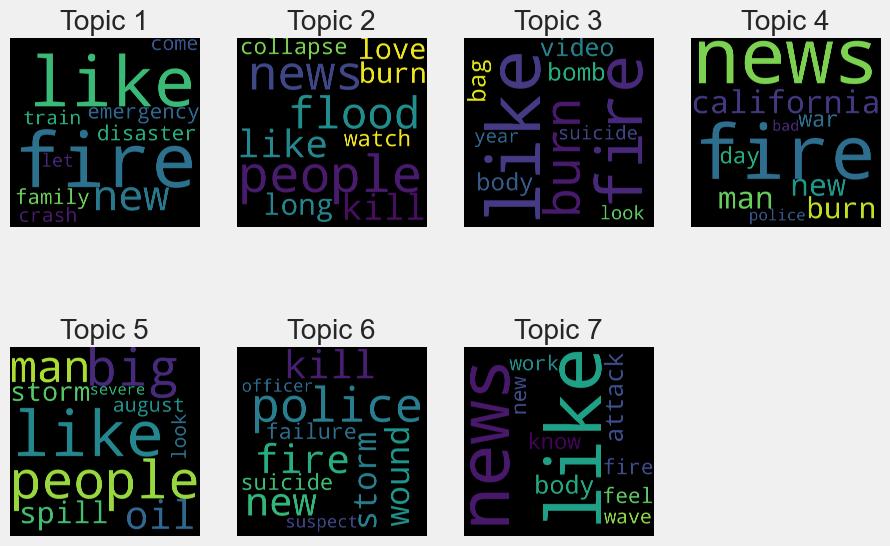

In [32]:
cloud = WordCloud(stopwords = STOP_WORDS, width = 4000, height = 4000)
topics = lda_model.show_topics(formatted = False)

fig, axes = plt.subplots(2,4, figsize = (10,7))
for i, ax in enumerate(axes.flatten()):
    if i < 7 :
        fig.add_subplot(ax)
        words = dict(topics[i][1])
        cloud.generate_from_frequencies(words)
        plt.gca().imshow(cloud)
        plt.gca().set_title('Topic ' + str(i + 1))
        plt.gca().axis('off')

fig.delaxes(axes[1][3])
plt.show()

In [33]:
# Get topic weights
topic_weights = []
for i, row_list in enumerate(lda_model[corpus]):
    topic_weights.append([w for i, w in row_list])

# Array of topic weights    
arr = pd.DataFrame(topic_weights).fillna(0).values

# Keep the well separated points (optional)
arr = arr[np.amax(arr, axis=1) > 0.35]

# Dominant topic number in each doc
topic_num = np.argmax(arr, axis=1)

# tSNE Dimension Reduction
tsne_model = TSNE(n_components=2, verbose=1, random_state=0, angle=.99, init='pca')
tsne_lda = tsne_model.fit_transform(arr)


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 7496 samples in 0.017s...
[t-SNE] Computed neighbors for 7496 samples in 0.160s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7496
[t-SNE] Computed conditional probabilities for sample 2000 / 7496
[t-SNE] Computed conditional probabilities for sample 3000 / 7496
[t-SNE] Computed conditional probabilities for sample 4000 / 7496
[t-SNE] Computed conditional probabilities for sample 5000 / 7496
[t-SNE] Computed conditional probabilities for sample 6000 / 7496
[t-SNE] Computed conditional probabilities for sample 7000 / 7496
[t-SNE] Computed conditional probabilities for sample 7496 / 7496
[t-SNE] Mean sigma: 0.000084
[t-SNE] KL divergence after 250 iterations with early exaggeration: 57.315609
[t-SNE] KL divergence after 1000 iterations: 0.453940


In [34]:
# Plot the Topic Clusters using Bokeh
output_notebook()
n_topics = 6
mycolors = np.array([color for name, color in mcolors.TABLEAU_COLORS.items()])
plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), 
              plot_width=900, plot_height=700)
plot.scatter(x=tsne_lda[:,0], y=tsne_lda[:,1], color=mycolors[topic_num])
show(plot)

Loading BokehJS ...

In [35]:
train_df['topic'] = ""
for i in range(len(train_df)) :
    train_df['topic'][i] = np.argmax(topic_weights[i])


<AxesSubplot:xlabel='target'>

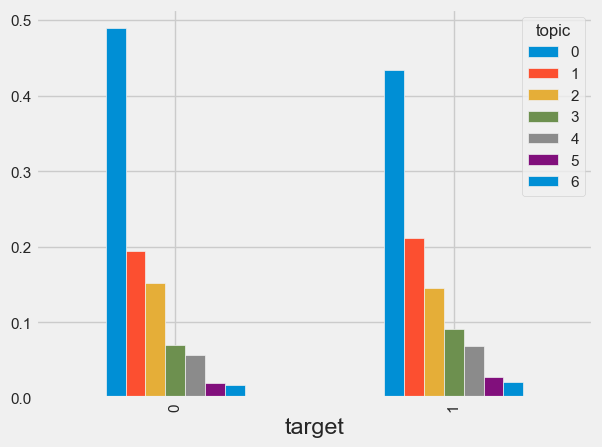

In [36]:
pd.crosstab(index = train_df['target'], columns = train_df['topic'], normalize = 'index').plot.bar()

Main topic identification does not seem to distinguish the disaster tweets from others.  

# 5. Models comparison : Could we predict the type of a tweet - disaster related or not ? 

## 5.1. Classifiers - Basic features & Topics

First of all, we tried traditional Machine Learning algorithms on text features. 
We tried to predict the nature of the tweets using the descriptive features and topics extracted before.  

In [37]:
X = train_df.loc[:, ['Nb_char', 'Nb_word', 'Avg_word_len', 'Nb_Exclam', 'Nb_Upper', 'Nb_Hashtag', 'Nb_At', 'Nb_link', 'Hashtag', 'At', 'Link', 'topic']]
Y = train_df.loc[:, 'target']

# Divide dataset Train set & Test set 
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.1, random_state = 0, stratify = Y)

In [38]:
cont_features = ['Nb_char', 'Nb_word', 'Avg_word_len', 'Nb_Exclam', 'Nb_Upper', 'Nb_Hashtag', 'Nb_At', 'Nb_link']
cat_features = ['Hashtag', 'At', 'Link', 'topic']

pipelines = [
    ('continu', 
     Pipeline(steps = [('scaler', StandardScaler(with_mean = True))]), 
     cont_features),
    ('categorical', 
     Pipeline(steps = [('encoder', OneHotEncoder(drop = 'first'))]), 
     cat_features)]

pips = ColumnTransformer(transformers = pipelines)

X_train = pips.fit_transform(X_train)
X_test = pips.transform(X_test)

In [39]:
names = [
    "Logistic regression",
    "Nearest Neighbors",
    "Linear SVM",
    "RBF SVM",
    "Decision Tree",
    "Random Forest",
    "Neural Net",
    "AdaBoost",
    "Naive Bayes",
    "QDA",
    "SGDC",
    "Gradient Boosting",
    "XGBoost",
    "Extra Trees"
]

classifiers = [
    LogisticRegression(),
    KNeighborsClassifier(10),
    SVC(kernel="linear"),
    SVC(gamma=2, C=1),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    MLPClassifier(alpha=1, max_iter=1000),
    AdaBoostClassifier(),
    GaussianNB(),
    QuadraticDiscriminantAnalysis(),
    SGDClassifier(loss="log", penalty="elasticnet"),
    GradientBoostingClassifier(),
    XGBClassifier(),
    ExtraTreesClassifier()
]

Bilan = []

for i in range(3,len(classifiers)) :
    model = classifiers[i]
    model.fit(X_train, Y_train)

    Y_train_pred = model.predict(X_train)
    Y_test_pred = model.predict(X_test)

    Bilan.append({'Model'           : names[i],
                  'Accuracy train'  : accuracy_score(Y_train, Y_train_pred),
                  'Accuracy test'   : accuracy_score(Y_test, Y_test_pred),
                  'Precision train' : precision_score(Y_train, Y_train_pred),
                  'Precision test'  : precision_score(Y_test, Y_test_pred),
                  'Recall train'    : recall_score(Y_train, Y_train_pred),
                  'Recall test'     : recall_score(Y_test, Y_test_pred),
                  'f1 score train'  : f1_score(Y_train, Y_train_pred),
                  'f1 score test'   : f1_score(Y_test, Y_test_pred), 
                  'ROC score train' : roc_auc_score(Y_train, Y_train_pred),
                  'ROC score test'  : roc_auc_score(Y_test, Y_test_pred)
                  }
                 )

In [40]:
pd.DataFrame(Bilan).round(3)

,Model,Accuracy train,Accuracy test,Precision train,Precision test,Recall train,Recall test,f1 score train,f1 score test,ROC score train,ROC score test
0,RBF SVM,0.820,0.690,0.824,0.687,0.736,0.500,0.777,0.579,0.810,0.665
1,Decision Tree,0.668,0.684,0.614,0.633,0.590,0.619,0.602,0.626,0.658,0.676
2,Random Forest,0.657,0.698,0.612,0.674,0.534,0.562,0.570,0.613,0.641,0.680
3,Neural Net,0.675,0.711,0.632,0.685,0.569,0.597,0.599,0.638,0.661,0.696
4,AdaBoost,0.677,0.694,0.631,0.658,0.582,0.584,0.605,0.619,0.665,0.680
5,Naive Bayes,0.641,0.668,0.571,0.603,0.629,0.647,0.599,0.624,0.639,0.666
6,QDA,0.639,0.675,0.568,0.605,0.642,0.684,0.603,0.642,0.640,0.676
7,SGDC,0.641,0.674,0.568,0.606,0.667,0.669,0.613,0.636,0.645,0.673
8,Gradient Boosting,0.704,0.715,0.671,0.687,0.601,0.609,0.634,0.646,0.691,0.701
9,XGBoost,0.834,0.678,0.825,0.634,0.774,0.578,0.799,0.605,0.826,0.665


## 5.2. Classifiers - TF-IDF and BoW

We then tried to use the same ML algorithms on the text itself. However, to do so, text had to be transformed into readable variables. There are two main ways that allow to transform text into variables. 

**Bag of Words (BoW)** : Using BoW, we transform a textual information into a representation that contains the occurrence of words within a document. It removes a lot of information from text, such as grammar, words order, meaning to keep only the word counts. This loss of information leads to the name of the method : Bag of Words as all words are putting together into a bag, regardless of their order and grammatical aspects. 

**Term Frequency and Inverse Document Frequency (TF-IDF)** : More complex that BoW, TF-IDF is a scoring / weighting system traditionnally used in the natural language processing (NLP). It combines information from terms and documents to quantify a term relevance in a document considering its occurrence into a complete corpus. 


In [41]:
Y = train_df.loc[:, 'target']

# Divide dataset Train set & Test set 
X_train, X_test, Y_train, Y_test = train_test_split(train_df['desc_lemma_text'], Y, test_size = 0.1, random_state = 0, stratify = Y)

In [42]:
# TF-IDF 
vectorizer = TfidfVectorizer(stop_words='english', use_idf = 1, smooth_idf = 1, sublinear_tf = 1)
X_tfidf_train = vectorizer.fit_transform(X_train).toarray()
X_tfidf_train = pd.DataFrame(X_tfidf_train, columns = vectorizer.get_feature_names())
X_tfidf_test = vectorizer.transform(X_test).toarray()
X_tfidf_test = pd.DataFrame(X_tfidf_test,columns = vectorizer.get_feature_names())

# BoW
vectorizer = CountVectorizer(stop_words='english')
X_BoW_train = vectorizer.fit_transform(X_train).toarray()
X_BoW_train = pd.DataFrame(X_BoW_train, columns = vectorizer.get_feature_names())
X_BoW_test = vectorizer.transform(X_test).toarray()
X_BoW_test = pd.DataFrame(X_BoW_test,columns = vectorizer.get_feature_names())

In [43]:

names = [
    "Logistic regression",
    "Nearest Neighbors",
    "Random Forest",
    "Neural Net",
    "AdaBoost",
    "SGDC",
    "XGBoost"]

classifiers = [
    LogisticRegression(),
    KNeighborsClassifier(10),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    MLPClassifier(alpha=1, max_iter=1000),
    AdaBoostClassifier(),
    SGDClassifier(loss="log", penalty="elasticnet"),
    XGBClassifier()
]

for i in range(0,len(classifiers)) :
    model = classifiers[i]
    model.fit(X_tfidf_train, Y_train)

    Y_train_pred = model.predict(X_tfidf_train)
    Y_test_pred = model.predict(X_tfidf_test)
    print (names[i])
    Bilan.append({'Model'           : 'TF-IFD ' + names[i],
                  'Accuracy train'  : accuracy_score(Y_train, Y_train_pred),
                  'Accuracy test'   : accuracy_score(Y_test, Y_test_pred),
                  'Precision train' : precision_score(Y_train, Y_train_pred),
                  'Precision test'  : precision_score(Y_test, Y_test_pred),
                  'Recall train'    : recall_score(Y_train, Y_train_pred),
                  'Recall test'     : recall_score(Y_test, Y_test_pred),
                  'f1 score train'  : f1_score(Y_train, Y_train_pred),
                  'f1 score test'   : f1_score(Y_test, Y_test_pred), 
                  'ROC score train' : roc_auc_score(Y_train, Y_train_pred),
                  'ROC score test'  : roc_auc_score(Y_test, Y_test_pred)
                  }
                 )

Logistic regression
Nearest Neighbors
Random Forest
Neural Net
AdaBoost
SGDC
XGBoost


In [44]:
pd.DataFrame(Bilan).round(3)

,Model,Accuracy train,Accuracy test,Precision train,Precision test,Recall train,Recall test,f1 score train,f1 score test,ROC score train,ROC score test
0,RBF SVM,0.820,0.690,0.824,0.687,0.736,0.500,0.777,0.579,0.810,0.665
1,Decision Tree,0.668,0.684,0.614,0.633,0.590,0.619,0.602,0.626,0.658,0.676
2,Random Forest,0.657,0.698,0.612,0.674,0.534,0.562,0.570,0.613,0.641,0.680
3,Neural Net,0.675,0.711,0.632,0.685,0.569,0.597,0.599,0.638,0.661,0.696
4,AdaBoost,0.677,0.694,0.631,0.658,0.582,0.584,0.605,0.619,0.665,0.680
5,Naive Bayes,0.641,0.668,0.571,0.603,0.629,0.647,0.599,0.624,0.639,0.666
6,QDA,0.639,0.675,0.568,0.605,0.642,0.684,0.603,0.642,0.640,0.676
7,SGDC,0.641,0.674,0.568,0.606,0.667,0.669,0.613,0.636,0.645,0.673
8,Gradient Boosting,0.704,0.715,0.671,0.687,0.601,0.609,0.634,0.646,0.691,0.701
9,XGBoost,0.834,0.678,0.825,0.634,0.774,0.578,0.799,0.605,0.826,0.665


In [45]:
for i in range(0,len(classifiers)) :
    model = classifiers[i]
    model.fit(X_BoW_train, Y_train)

    Y_train_pred = model.predict(X_BoW_train)
    Y_test_pred = model.predict(X_BoW_test)

    Bilan.append({'Model'           : 'BoW ' + names[i],
                  'Accuracy train'  : accuracy_score(Y_train, Y_train_pred),
                  'Accuracy test'   : accuracy_score(Y_test, Y_test_pred),
                  'Precision train' : precision_score(Y_train, Y_train_pred),
                  'Precision test'  : precision_score(Y_test, Y_test_pred),
                  'Recall train'    : recall_score(Y_train, Y_train_pred),
                  'Recall test'     : recall_score(Y_test, Y_test_pred),
                  'f1 score train'  : f1_score(Y_train, Y_train_pred),
                  'f1 score test'   : f1_score(Y_test, Y_test_pred), 
                  'ROC score train' : roc_auc_score(Y_train, Y_train_pred),
                  'ROC score test'  : roc_auc_score(Y_test, Y_test_pred)
                  }
                 )

In [46]:
pd.DataFrame(Bilan).round(3)

,Model,Accuracy train,Accuracy test,Precision train,Precision test,Recall train,Recall test,f1 score train,f1 score test,ROC score train,ROC score test
0,RBF SVM,0.820,0.690,0.824,0.687,0.736,0.500,0.777,0.579,0.810,0.665
1,Decision Tree,0.668,0.684,0.614,0.633,0.590,0.619,0.602,0.626,0.658,0.676
2,Random Forest,0.657,0.698,0.612,0.674,0.534,0.562,0.570,0.613,0.641,0.680
3,Neural Net,0.675,0.711,0.632,0.685,0.569,0.597,0.599,0.638,0.661,0.696
4,AdaBoost,0.677,0.694,0.631,0.658,0.582,0.584,0.605,0.619,0.665,0.680
5,Naive Bayes,0.641,0.668,0.571,0.603,0.629,0.647,0.599,0.624,0.639,0.666
6,QDA,0.639,0.675,0.568,0.605,0.642,0.684,0.603,0.642,0.640,0.676
7,SGDC,0.641,0.674,0.568,0.606,0.667,0.669,0.613,0.636,0.645,0.673
8,Gradient Boosting,0.704,0.715,0.671,0.687,0.601,0.609,0.634,0.646,0.691,0.701
9,XGBoost,0.834,0.678,0.825,0.634,0.774,0.578,0.799,0.605,0.826,0.665


## 5.3. Neural networks

Dealing with natural texts, neural networks may offer interesting performances as they allow to deal with the text sequentiality. 

### 5.3.1. Tokenization and Spliting

The tokenization is simply the process of splitting a text into smaller units (usually words) that are called tokens. 

In [47]:
tokenizer = tf.keras.preprocessing.text.Tokenizer() 
tokenizer.fit_on_texts(train_df["cleaned"])
vocab_length = len(tokenizer.word_index) + 1

In [48]:
train_df["tweet_encoded"] = tokenizer.texts_to_sequences(train_df["cleaned"])
pads = tf.keras.preprocessing.sequence.pad_sequences(train_df['tweet_encoded'], padding="post")

In [49]:
Y = train_df['target']
# Divide dataset Train set & Test set 
X_train, X_test, Y_train, Y_test = train_test_split(pads, Y, test_size = 0.1, random_state = 0, stratify = Y)
X_train

array([[  55,   16,   14, ...,    0,    0,    0],
       [3296,  154, 6323, ...,    0,    0,    0],
       [  73,    9, 1661, ...,    0,    0,    0],
       ...,
       [  24,    9,  203, ...,    0,    0,    0],
       [   2,  270,    3, ...,    0,    0,    0],
       [  59,    7,    3, ...,    0,    0,    0]])

In [50]:

# Creation of tensorflow tensors from train and validation sets
train_ts = tf.data.Dataset.from_tensor_slices((X_train, Y_train))
test_ts = tf.data.Dataset.from_tensor_slices((X_test, Y_test))
# Shuffling and batching
train_ts = train_ts.shuffle(len(train_ts)).batch(128)
test_ts = test_ts.shuffle(len(test_ts)).batch(128)

### 5.3.2. Recurrent Neural Network (RNN)

RNN are a reference algorithm for sequential data thanks to its internal memory (it remembers its input). For this reason, RNN is widely used for voice / speech treatement. Its memory allows RNN to predict what is coming next and to has a better understanding of a sequence and of a context compared to other kind of algorithms. 

RNN is usually opposed to feed-forward neural networks. These last ones ony allow information to move forward from one layer to the next one until the output layer. This constraint does not allow FFNN to remember previous information. 
In RNN, information can circulate through a loop in which the current decision can be informed by the previously received input. Thus, a RNN has 2 simultaneous inputs : the present and the recent / immediate past which is crucial which dealing with sequential information such as text. 

RNN have 2 main issues, both being related to the notion of gradient. The gradient is a partial derivative that allows to measure the change of an output due to a small change in the input. Said differently, a gradient measures the change in the network weights after a change in error. 
- Exploding gradients : Too much importance is put on weights. 
- Vanishing gradients : The gradient becomes too small leading to a model unable to learn or learning very slowly. 

Maximum lenght for a tweet : 31


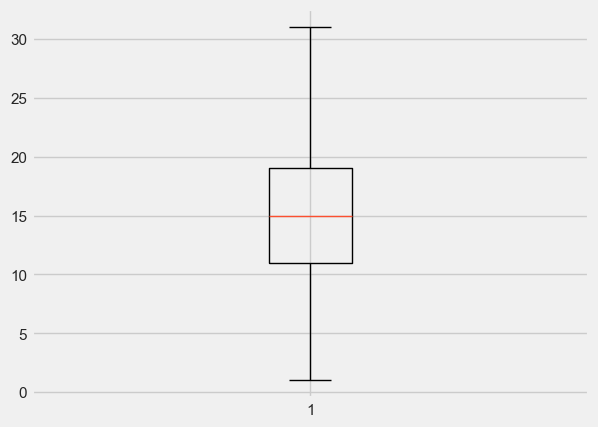

In [51]:
print('Maximum lenght for a tweet :', max(train_df['Nb_word']))
plt.boxplot(train_df['Nb_word']);

As the length of the tweets in the database remained reasonable, we can begin by a simple recurrent neural network (RNN) structure.

How to parametrize a RNN ? 
- First layer - Embedding : The parameters of this layer are the following. The input dimension is the size of the vocabulary / corpus. The input length is the number of entries (dimension of the dataset in input). The output dimension is the size of the vector space in which words will be embedded (usually between 32 and 100 - this parameter could be optimized)
- Second layer - Simple RNN : We include a number of units / neurons. 
- Additional layers - ReLu and Dropouts :  ReLu is useful for the backpropagation of the error and can be very useful associated with sigmoidal functions as it prevents the vanishing gradient problem. Dropouts randomly deactivates a part of the neurons to prevent overfitting (by nullifying their contribution to the output)
- Final layer - Output : One neuron with sigmoid activation function (to predict a binary endpoint)

In [52]:
model_sRNN = tf.keras.models.Sequential([
  tf.keras.layers.Embedding(input_dim = pads.max() + 1, 
                            output_dim = 32,
                            input_length = (X_train.shape[-1])),
  tf.keras.layers.SimpleRNN(units = 16, 
                            return_sequences = False), 
  tf.keras.layers.Dense(64, activation = 'relu'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(1, activation = "sigmoid") 
])

display(model_sRNN.summary())
#tf.keras.utils.plot_model(model_sRNN, show_shapes = True)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 32, 32)            415008    
                                                                 
 simple_rnn (SimpleRNN)      (None, 16)                784       
                                                                 
 dense (Dense)               (None, 64)                1088      
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 416,945
Trainable params: 416,945
Non-trainable params: 0
_________________________________________________________________


None

We used Adam optimizer (Adaptative Moment estimation) which replaced the classci stochastic gradient descent and which is more specificatlly dedicated to NLP. 

In [53]:
model_sRNN.compile(optimizer = tf.keras.optimizers.Adam(1e-4),
              loss = tf.keras.losses.BinaryCrossentropy(),
              metrics = ['accuracy', 
                         tfa.metrics.F1Score(num_classes = 1, average = 'micro', threshold = 0.5)])

In [54]:
model_sRNN.fit(
    train_ts,
    validation_data = test_ts,
    epochs = 15)

Epoch 1/15
53/53 [==============================] - 3s 15ms/step - loss: 0.6917 - accuracy: 0.5246 - f1_score: 0.3644 - val_loss: 0.6869 - val_accuracy: 0.5766 - val_f1_score: 0.0756
Epoch 2/15
53/53 [==============================] - 1s 10ms/step - loss: 0.6813 - accuracy: 0.5749 - f1_score: 0.0742 - val_loss: 0.6794 - val_accuracy: 0.5752 - val_f1_score: 0.0124
Epoch 3/15
53/53 [==============================] - 1s 9ms/step - loss: 0.6626 - accuracy: 0.6339 - f1_score: 0.3060 - val_loss: 0.6371 - val_accuracy: 0.7071 - val_f1_score: 0.5686
Epoch 4/15
53/53 [==============================] - 0s 9ms/step - loss: 0.5833 - accuracy: 0.7644 - f1_score: 0.6883 - val_loss: 0.5560 - val_accuracy: 0.7617 - val_f1_score: 0.7041
Epoch 5/15
53/53 [==============================] - 1s 9ms/step - loss: 0.4915 - accuracy: 0.8229 - f1_score: 0.7739 - val_loss: 0.5168 - val_accuracy: 0.7856 - val_f1_score: 0.7356
Epoch 6/15
53/53 [==============================] - 1s 9ms/step - loss: 0.4277 - accurac

In [55]:
pio.renderers.default = "notebook"

history = model_sRNN.history.history
fig = make_subplots(rows = 1, cols = 3, subplot_titles = ("Loss", "Accuracy", "F1-score"))

fig.add_trace(go.Scatter(y = history["loss"],
                    mode = 'lines',
                    name = 'loss',
                    legendgroup = "Loss",
                    line_color = "pink"),
              row = 1,
              col = 1)
fig.add_trace(go.Scatter(y = history["val_loss"],
                    mode = 'lines',
                    name = 'val_loss',
                    legendgroup = "Loss",
                    line_color = "red"),
              row = 1,
              col = 1)

fig.add_trace(go.Scatter(y = history["accuracy"],
                    mode = 'lines',
                    name = 'accuracy',
                    legendgroup = "Accuracy",
                    line_color = "lightblue"),
              row = 1,
              col = 2)
fig.add_trace(go.Scatter(y = history["val_accuracy"],
                    mode = 'lines',
                    name = 'val_accuracy',
                    legendgroup = "Accuracy",
                    line_color = "blue"),
              row = 1,
              col = 2)

fig.add_trace(go.Scatter(y = history["f1_score"],
                    mode = 'lines',
                    name = 'f1_score',
                    legendgroup = "F1-score",
                    line_color = "lightgreen"),
              row = 1,
              col = 3)
fig.add_trace(go.Scatter(y = history["val_f1_score"],
                    mode = 'lines',
                    name = 'val_f1_score',
                    legendgroup = "F1-score",
                    line_color = "green"),
              row = 1,
              col = 3)

fig.update_layout(title_text = "Simple RNN model performances", width = 1500,
                  yaxis2_range = [0, 1], yaxis3_range = [0, 1])
fig.show()

The sRNN begins to overfit after 7 epochs. We used this parameter for its final training

In [56]:
model_sRNN = tf.keras.models.Sequential([
  tf.keras.layers.Embedding(input_dim = pads.max() + 1, 
                            output_dim = 32,
                            input_length = (X_train.shape[-1])),
  tf.keras.layers.SimpleRNN(units = 16, 
                            return_sequences = False), 
  tf.keras.layers.Dense(64, activation = 'relu'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(1, activation = "sigmoid") 
])
model_sRNN.compile(optimizer = tf.keras.optimizers.Adam(1e-4),
              loss = tf.keras.losses.BinaryCrossentropy(),
              metrics = ['accuracy', 
                         tfa.metrics.F1Score(num_classes = 1, average = 'micro', threshold = 0.5)])
model_sRNN.fit(
    train_ts,
    validation_data = test_ts,
    epochs = 7)

Epoch 1/7
53/53 [==============================] - 2s 16ms/step - loss: 0.6929 - accuracy: 0.5095 - f1_score: 0.4298 - val_loss: 0.6905 - val_accuracy: 0.5393 - val_f1_score: 0.2638
Epoch 2/7
53/53 [==============================] - 1s 10ms/step - loss: 0.6846 - accuracy: 0.5890 - f1_score: 0.2948 - val_loss: 0.6848 - val_accuracy: 0.5766 - val_f1_score: 0.0966
Epoch 3/7
53/53 [==============================] - 1s 10ms/step - loss: 0.6747 - accuracy: 0.6047 - f1_score: 0.2266 - val_loss: 0.6768 - val_accuracy: 0.5819 - val_f1_score: 0.1029
Epoch 4/7
53/53 [==============================] - 0s 9ms/step - loss: 0.6534 - accuracy: 0.6437 - f1_score: 0.3361 - val_loss: 0.6597 - val_accuracy: 0.6178 - val_f1_score: 0.3279
Epoch 5/7
53/53 [==============================] - 1s 9ms/step - loss: 0.6026 - accuracy: 0.7190 - f1_score: 0.5589 - val_loss: 0.6223 - val_accuracy: 0.6698 - val_f1_score: 0.5356
Epoch 6/7
53/53 [==============================] - 0s 9ms/step - loss: 0.5170 - accuracy: 0.

In [57]:

Bilan.append({'Model'           : 'sRNN',
                  'Accuracy train'  : accuracy_score(Y_train, np.round(model_sRNN(X_train))),
                  'Accuracy test'   : accuracy_score(Y_test, np.round(model_sRNN(X_test))),
                  'Precision train' : precision_score(Y_train, np.round(model_sRNN(X_train))),
                  'Precision test'  : precision_score(Y_test,  np.round(model_sRNN(X_test))),
                  'Recall train'    : recall_score(Y_train, np.round(model_sRNN(X_train))),
                  'Recall test'     : recall_score(Y_test,  np.round(model_sRNN(X_test))),
                  'f1 score train'  : f1_score(Y_train, np.round(model_sRNN(X_train))),
                  'f1 score test'   : f1_score(Y_test,  np.round(model_sRNN(X_test))), 
                  'ROC score train' : roc_auc_score(Y_train, np.round(model_sRNN(X_train))),
                  'ROC score test'  : roc_auc_score(Y_test,  np.round(model_sRNN(X_test)))
                  }
                 )

In [58]:
round(pd.DataFrame(Bilan),3)

,Model,Accuracy train,Accuracy test,Precision train,Precision test,Recall train,Recall test,f1 score train,f1 score test,ROC score train,ROC score test
0,RBF SVM,0.820,0.690,0.824,0.687,0.736,0.500,0.777,0.579,0.810,0.665
1,Decision Tree,0.668,0.684,0.614,0.633,0.590,0.619,0.602,0.626,0.658,0.676
2,Random Forest,0.657,0.698,0.612,0.674,0.534,0.562,0.570,0.613,0.641,0.680
3,Neural Net,0.675,0.711,0.632,0.685,0.569,0.597,0.599,0.638,0.661,0.696
4,AdaBoost,0.677,0.694,0.631,0.658,0.582,0.584,0.605,0.619,0.665,0.680
5,Naive Bayes,0.641,0.668,0.571,0.603,0.629,0.647,0.599,0.624,0.639,0.666
6,QDA,0.639,0.675,0.568,0.605,0.642,0.684,0.603,0.642,0.640,0.676
7,SGDC,0.641,0.674,0.568,0.606,0.667,0.669,0.613,0.636,0.645,0.673
8,Gradient Boosting,0.704,0.715,0.671,0.687,0.601,0.609,0.634,0.646,0.691,0.701
9,XGBoost,0.834,0.678,0.825,0.634,0.774,0.578,0.799,0.605,0.826,0.665


### 5.3.3. Long Short-Term Memory (LSTM) RNN

LSTM is an extension of the RNN models and has been introduced to solve the 2 gradient issues of RNN. LSTM can be seen as a memory extension. As we have seen, RNN has 2 inputs : the present and the immediate past. However, when we have information with a long sequence, this king of short term memory may not be sufficient. 
With the introduction of "gates" (output gate, forget gate, input/update gate), the LSTM neurons will be able to store (or not) and then to delete (or not) the information based on this information relevance / importance (weights).   


In [59]:
model_LSTM = tf.keras.models.Sequential([
  tf.keras.layers.Embedding(input_dim = pads.max() + 1, 
                            output_dim = 32,
                            input_length = (X_train.shape[-1])),
  tf.keras.layers.LSTM(units=16, return_sequences=False), # returns the last output
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(1, activation="sigmoid") # the prediction layer
])

display(model_LSTM.summary())
#tf.keras.utils.plot_model(model_LSTM, show_shapes = True)

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (None, 32, 32)            415008    
                                                                 
 lstm (LSTM)                 (None, 16)                3136      
                                                                 
 dropout_2 (Dropout)         (None, 16)                0         
                                                                 
 dense_4 (Dense)             (None, 1)                 17        
                                                                 
Total params: 418,161
Trainable params: 418,161
Non-trainable params: 0
_________________________________________________________________


None

In [60]:
model_LSTM.compile(optimizer = tf.keras.optimizers.Adam(1e-4),
              loss = tf.keras.losses.BinaryCrossentropy(),
              metrics = ['accuracy', 
                         tfa.metrics.F1Score(num_classes = 1, average = 'micro', threshold = 0.5)])

In [61]:
model_LSTM.fit(
    train_ts,
    validation_data = test_ts,
    epochs = 15)

Epoch 1/15
53/53 [==============================] - 3s 25ms/step - loss: 0.6893 - accuracy: 0.5732 - f1_score: 0.0014 - val_loss: 0.6873 - val_accuracy: 0.5739 - val_f1_score: 0.0000e+00
Epoch 2/15
53/53 [==============================] - 1s 16ms/step - loss: 0.6857 - accuracy: 0.5738 - f1_score: 0.0000e+00 - val_loss: 0.6846 - val_accuracy: 0.5739 - val_f1_score: 0.0000e+00
Epoch 3/15
53/53 [==============================] - 1s 14ms/step - loss: 0.6836 - accuracy: 0.5738 - f1_score: 0.0000e+00 - val_loss: 0.6830 - val_accuracy: 0.5739 - val_f1_score: 0.0000e+00
Epoch 4/15
53/53 [==============================] - 1s 14ms/step - loss: 0.6823 - accuracy: 0.5738 - f1_score: 0.0000e+00 - val_loss: 0.6821 - val_accuracy: 0.5739 - val_f1_score: 0.0000e+00
Epoch 5/15
53/53 [==============================] - 1s 15ms/step - loss: 0.6818 - accuracy: 0.5738 - f1_score: 0.0000e+00 - val_loss: 0.6814 - val_accuracy: 0.5739 - val_f1_score: 0.0000e+00
Epoch 6/15
53/53 [==============================]

In [62]:
pio.renderers.default = "notebook"

history = model_LSTM.history.history
fig = make_subplots(rows = 1, cols = 3, subplot_titles = ("Loss", "Accuracy", "F1-score"))

fig.add_trace(go.Scatter(y = history["loss"],
                    mode = 'lines',
                    name = 'loss',
                    legendgroup = "Loss",
                    line_color = "pink"),
              row = 1,
              col = 1)
fig.add_trace(go.Scatter(y = history["val_loss"],
                    mode = 'lines',
                    name = 'val_loss',
                    legendgroup = "Loss",
                    line_color = "red"),
              row = 1,
              col = 1)

fig.add_trace(go.Scatter(y = history["accuracy"],
                    mode = 'lines',
                    name = 'accuracy',
                    legendgroup = "Accuracy",
                    line_color = "lightblue"),
              row = 1,
              col = 2)
fig.add_trace(go.Scatter(y = history["val_accuracy"],
                    mode = 'lines',
                    name = 'val_accuracy',
                    legendgroup = "Accuracy",
                    line_color = "blue"),
              row = 1,
              col = 2)

fig.add_trace(go.Scatter(y = history["f1_score"],
                    mode = 'lines',
                    name = 'f1_score',
                    legendgroup = "F1-score",
                    line_color = "lightgreen"),
              row = 1,
              col = 3)
fig.add_trace(go.Scatter(y = history["val_f1_score"],
                    mode = 'lines',
                    name = 'val_f1_score',
                    legendgroup = "F1-score",
                    line_color = "green"),
              row = 1,
              col = 3)

fig.update_layout(title_text = "LSTM model performances", width = 1500,
                  yaxis2_range = [0, 1], yaxis3_range = [0, 1])
fig.show()

The model begins to overfit after 8 epochs. We used this parameter for its final training

In [63]:
model_LSTM = tf.keras.models.Sequential([
  tf.keras.layers.Embedding(input_dim = pads.max() + 1, 
                            output_dim = 32,
                            input_length = (X_train.shape[-1])),
  tf.keras.layers.LSTM(units=16, return_sequences=False), # returns the last output
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(1, activation="sigmoid") # the prediction layer
])
model_LSTM.compile(optimizer = tf.keras.optimizers.Adam(1e-4),
              loss = tf.keras.losses.BinaryCrossentropy(),
              metrics = ['accuracy', 
                         tfa.metrics.F1Score(num_classes = 1, average = 'micro', threshold = 0.5)])
model_LSTM.fit(
    train_ts,
    validation_data = test_ts,
    epochs = 10)

Epoch 1/10
53/53 [==============================] - 3s 25ms/step - loss: 0.6931 - accuracy: 0.5046 - f1_score: 0.4515 - val_loss: 0.6898 - val_accuracy: 0.5739 - val_f1_score: 0.0000e+00
Epoch 2/10
53/53 [==============================] - 1s 17ms/step - loss: 0.6874 - accuracy: 0.5738 - f1_score: 0.0000e+00 - val_loss: 0.6854 - val_accuracy: 0.5739 - val_f1_score: 0.0000e+00
Epoch 3/10
53/53 [==============================] - 1s 15ms/step - loss: 0.6839 - accuracy: 0.5738 - f1_score: 0.0000e+00 - val_loss: 0.6826 - val_accuracy: 0.5739 - val_f1_score: 0.0000e+00
Epoch 4/10
53/53 [==============================] - 1s 14ms/step - loss: 0.6817 - accuracy: 0.5738 - f1_score: 0.0000e+00 - val_loss: 0.6810 - val_accuracy: 0.5739 - val_f1_score: 0.0000e+00
Epoch 5/10
53/53 [==============================] - 1s 14ms/step - loss: 0.6798 - accuracy: 0.5738 - f1_score: 0.0000e+00 - val_loss: 0.6783 - val_accuracy: 0.5739 - val_f1_score: 0.0000e+00
Epoch 6/10
53/53 [==============================]

In [64]:

Bilan.append({'Model'           : 'LSTM',
                  'Accuracy train'  : accuracy_score(Y_train, np.round(model_LSTM(X_train))),
                  'Accuracy test'   : accuracy_score(Y_test, np.round(model_LSTM(X_test))),
                  'Precision train' : precision_score(Y_train, np.round(model_LSTM(X_train))),
                  'Precision test'  : precision_score(Y_test,  np.round(model_LSTM(X_test))),
                  'Recall train'    : recall_score(Y_train, np.round(model_LSTM(X_train))),
                  'Recall test'     : recall_score(Y_test,  np.round(model_LSTM(X_test))),
                  'f1 score train'  : f1_score(Y_train, np.round(model_LSTM(X_train))),
                  'f1 score test'   : f1_score(Y_test,  np.round(model_LSTM(X_test))), 
                  'ROC score train' : roc_auc_score(Y_train, np.round(model_LSTM(X_train))),
                  'ROC score test'  : roc_auc_score(Y_test,  np.round(model_LSTM(X_test)))
                  }
                 )

In [65]:
round(pd.DataFrame(Bilan),3)

,Model,Accuracy train,Accuracy test,Precision train,Precision test,Recall train,Recall test,f1 score train,f1 score test,ROC score train,ROC score test
0,RBF SVM,0.820,0.690,0.824,0.687,0.736,0.500,0.777,0.579,0.810,0.665
1,Decision Tree,0.668,0.684,0.614,0.633,0.590,0.619,0.602,0.626,0.658,0.676
2,Random Forest,0.657,0.698,0.612,0.674,0.534,0.562,0.570,0.613,0.641,0.680
3,Neural Net,0.675,0.711,0.632,0.685,0.569,0.597,0.599,0.638,0.661,0.696
4,AdaBoost,0.677,0.694,0.631,0.658,0.582,0.584,0.605,0.619,0.665,0.680
5,Naive Bayes,0.641,0.668,0.571,0.603,0.629,0.647,0.599,0.624,0.639,0.666
6,QDA,0.639,0.675,0.568,0.605,0.642,0.684,0.603,0.642,0.640,0.676
7,SGDC,0.641,0.674,0.568,0.606,0.667,0.669,0.613,0.636,0.645,0.673
8,Gradient Boosting,0.704,0.715,0.671,0.687,0.601,0.609,0.634,0.646,0.691,0.701
9,XGBoost,0.834,0.678,0.825,0.634,0.774,0.578,0.799,0.605,0.826,0.665


### 5.3.4. Bidirectional LSTM

The bLSTM has been used primarily on natural language processing. Its bidirectional characteristic allows the input to flow in both direction and the decision is made according to the 2 flows at a given time. the bLSTM is simply the addition of a second LSTM layer in the reverse direction and output from the 2 layers are combined to lead to a decision. 

In [66]:
model_bLSTM = tf.keras.Sequential([
    tf.keras.layers.Embedding(input_dim = pads.max() + 1, 
                            output_dim = 32,
                            input_length = (X_train.shape[-1])),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(16,return_sequences=True)),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(16)),
    tf.keras.layers.Dense(18,activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(9,activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(1,activation='sigmoid')])
model_bLSTM.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy', 
                         tfa.metrics.F1Score(num_classes = 1, average = 'micro', threshold = 0.5)])
model_bLSTM.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_4 (Embedding)     (None, 32, 32)            415008    
                                                                 
 bidirectional (Bidirectiona  (None, 32, 32)           6272      
 l)                                                              
                                                                 
 bidirectional_1 (Bidirectio  (None, 32)               6272      
 nal)                                                            
                                                                 
 dense_6 (Dense)             (None, 18)                594       
                                                                 
 dropout_4 (Dropout)         (None, 18)                0         
                                                                 
 batch_normalization (BatchN  (None, 18)              

In [67]:
# Entrainement du modèle 
history = model_bLSTM.fit(train_ts,
    validation_data = test_ts,
    epochs = 20)

Epoch 1/20
53/53 [==============================] - 9s 57ms/step - loss: 0.6542 - accuracy: 0.6453 - f1_score: 0.5569 - val_loss: 0.6735 - val_accuracy: 0.5739 - val_f1_score: 0.0000e+00
Epoch 2/20
53/53 [==============================] - 2s 28ms/step - loss: 0.4480 - accuracy: 0.8072 - f1_score: 0.7513 - val_loss: 0.6562 - val_accuracy: 0.5739 - val_f1_score: 0.0000e+00
Epoch 3/20
53/53 [==============================] - 2s 29ms/step - loss: 0.3322 - accuracy: 0.8808 - f1_score: 0.8514 - val_loss: 0.6442 - val_accuracy: 0.5739 - val_f1_score: 0.0000e+00
Epoch 4/20
53/53 [==============================] - 2s 29ms/step - loss: 0.2587 - accuracy: 0.9182 - f1_score: 0.8996 - val_loss: 0.6271 - val_accuracy: 0.5752 - val_f1_score: 0.0062
Epoch 5/20
53/53 [==============================] - 2s 29ms/step - loss: 0.2094 - accuracy: 0.9393 - f1_score: 0.9262 - val_loss: 0.6072 - val_accuracy: 0.6112 - val_f1_score: 0.1657
Epoch 6/20
53/53 [==============================] - 2s 29ms/step - loss: 

In [68]:
pio.renderers.default = "notebook"

history = model_bLSTM.history.history
fig = make_subplots(rows = 1, cols = 3, subplot_titles = ("Loss", "Accuracy", "F1-score"))

fig.add_trace(go.Scatter(y = history["loss"],
                    mode = 'lines',
                    name = 'loss',
                    legendgroup = "Loss",
                    line_color = "pink"),
              row = 1,
              col = 1)
fig.add_trace(go.Scatter(y = history["val_loss"],
                    mode = 'lines',
                    name = 'val_loss',
                    legendgroup = "Loss",
                    line_color = "red"),
              row = 1,
              col = 1)

fig.add_trace(go.Scatter(y = history["accuracy"],
                    mode = 'lines',
                    name = 'accuracy',
                    legendgroup = "Accuracy",
                    line_color = "lightblue"),
              row = 1,
              col = 2)
fig.add_trace(go.Scatter(y = history["val_accuracy"],
                    mode = 'lines',
                    name = 'val_accuracy',
                    legendgroup = "Accuracy",
                    line_color = "blue"),
              row = 1,
              col = 2)

fig.add_trace(go.Scatter(y = history["f1_score"],
                    mode = 'lines',
                    name = 'f1_score',
                    legendgroup = "F1-score",
                    line_color = "lightgreen"),
              row = 1,
              col = 3)
fig.add_trace(go.Scatter(y = history["val_f1_score"],
                    mode = 'lines',
                    name = 'val_f1_score',
                    legendgroup = "F1-score",
                    line_color = "green"),
              row = 1,
              col = 3)

fig.update_layout(title_text = "bLSTM model performances", width = 1500,
                  yaxis2_range = [0, 1], yaxis3_range = [0, 1])
fig.show()

In [69]:
model_bLSTM = tf.keras.Sequential([
    tf.keras.layers.Embedding(input_dim = pads.max() + 1, 
                            output_dim = 32,
                            input_length = (X_train.shape[-1])),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(16,return_sequences=True)),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(16)),
    tf.keras.layers.Dense(18,activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(9,activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(1,activation='sigmoid')])
model_bLSTM.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy', 
                         tfa.metrics.F1Score(num_classes = 1, average = 'micro', threshold = 0.5)])

model_bLSTM.fit(
    train_ts,
    validation_data = test_ts,
    epochs = 10)

Epoch 1/10
53/53 [==============================] - 9s 57ms/step - loss: 0.6811 - accuracy: 0.6046 - f1_score: 0.5312 - val_loss: 0.6794 - val_accuracy: 0.5739 - val_f1_score: 0.0000e+00
Epoch 2/10
53/53 [==============================] - 2s 29ms/step - loss: 0.4697 - accuracy: 0.8007 - f1_score: 0.7446 - val_loss: 0.6560 - val_accuracy: 0.5739 - val_f1_score: 0.0000e+00
Epoch 3/10
53/53 [==============================] - 2s 29ms/step - loss: 0.3258 - accuracy: 0.8861 - f1_score: 0.8565 - val_loss: 0.6151 - val_accuracy: 0.6485 - val_f1_score: 0.3053
Epoch 4/10
53/53 [==============================] - 2s 29ms/step - loss: 0.2411 - accuracy: 0.9280 - f1_score: 0.9121 - val_loss: 0.5829 - val_accuracy: 0.7537 - val_f1_score: 0.6278
Epoch 5/10
53/53 [==============================] - 2s 30ms/step - loss: 0.1953 - accuracy: 0.9468 - f1_score: 0.9362 - val_loss: 0.5637 - val_accuracy: 0.7417 - val_f1_score: 0.5941
Epoch 6/10
53/53 [==============================] - 2s 29ms/step - loss: 0.15

In [70]:

Bilan.append({'Model'           : 'bLSTM',
                  'Accuracy train'  : accuracy_score(Y_train, np.round(model_bLSTM(X_train))),
                  'Accuracy test'   : accuracy_score(Y_test, np.round(model_bLSTM(X_test))),
                  'Precision train' : precision_score(Y_train, np.round(model_bLSTM(X_train))),
                  'Precision test'  : precision_score(Y_test,  np.round(model_bLSTM(X_test))),
                  'Recall train'    : recall_score(Y_train, np.round(model_bLSTM(X_train))),
                  'Recall test'     : recall_score(Y_test,  np.round(model_bLSTM(X_test))),
                  'f1 score train'  : f1_score(Y_train, np.round(model_bLSTM(X_train))),
                  'f1 score test'   : f1_score(Y_test,  np.round(model_bLSTM(X_test))), 
                  'ROC score train' : roc_auc_score(Y_train, np.round(model_bLSTM(X_train))),
                  'ROC score test'  : roc_auc_score(Y_test,  np.round(model_bLSTM(X_test)))
                  }
                 )

In [71]:
round(pd.DataFrame(Bilan),3)

,Model,Accuracy train,Accuracy test,Precision train,Precision test,Recall train,Recall test,f1 score train,f1 score test,ROC score train,ROC score test
0,RBF SVM,0.820,0.690,0.824,0.687,0.736,0.500,0.777,0.579,0.810,0.665
1,Decision Tree,0.668,0.684,0.614,0.633,0.590,0.619,0.602,0.626,0.658,0.676
2,Random Forest,0.657,0.698,0.612,0.674,0.534,0.562,0.570,0.613,0.641,0.680
3,Neural Net,0.675,0.711,0.632,0.685,0.569,0.597,0.599,0.638,0.661,0.696
4,AdaBoost,0.677,0.694,0.631,0.658,0.582,0.584,0.605,0.619,0.665,0.680
5,Naive Bayes,0.641,0.668,0.571,0.603,0.629,0.647,0.599,0.624,0.639,0.666
6,QDA,0.639,0.675,0.568,0.605,0.642,0.684,0.603,0.642,0.640,0.676
7,SGDC,0.641,0.674,0.568,0.606,0.667,0.669,0.613,0.636,0.645,0.673
8,Gradient Boosting,0.704,0.715,0.671,0.687,0.601,0.609,0.634,0.646,0.691,0.701
9,XGBoost,0.834,0.678,0.825,0.634,0.774,0.578,0.799,0.605,0.826,0.665


### 5.3.5. Transfer learning - Universal sentence encoder

In this final algorithm, we will use a pre-trained embedding layer, the Universal Sentence Encoder, specially conceived to generate sentence embeddings. 

In [73]:
module_url = 'https://tfhub.dev/google/universal-sentence-encoder-large/5'

In [ ]:
model_USE = tf.keras.models.Sequential([
  hub.KerasLayer(module_url, trainable=True, name='USE_embedding'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(1, activation="sigmoid") # the prediction layer
])

In [75]:
model_USE.compile(optimizer = tf.keras.optimizers.Adam(1e-4),
              loss = tf.keras.losses.BinaryCrossentropy(),
              metrics = ['accuracy', 
                         tfa.metrics.F1Score(num_classes = 1, average = 'micro', threshold = 0.5)])

In [76]:
X_train, X_test, Y_train, Y_test = train_test_split(train_df['text'], Y, test_size = 0.1, random_state = 0, stratify = Y)

In [77]:
# Creation of tensorflow tensors from train and validation sets
train_ts = tf.data.Dataset.from_tensor_slices((X_train, Y_train))
test_ts = tf.data.Dataset.from_tensor_slices((X_test, Y_test))

# Shuffling and batching
train_ts = train_ts.shuffle(len(train_ts)).batch(128)
test_ts = test_ts.shuffle(len(test_ts)).batch(128)

In [ ]:

model_USE.fit(
    train_ts,
    validation_data = test_ts, 
    epochs = 20)

In [79]:
pio.renderers.default = "notebook"

history = model_USE.history.history
fig = make_subplots(rows = 1, cols = 3, subplot_titles = ("Loss", "Accuracy", "F1-score"))

fig.add_trace(go.Scatter(y = history["loss"],
                    mode = 'lines',
                    name = 'loss',
                    legendgroup = "Loss",
                    line_color = "pink"),
              row = 1,
              col = 1)
fig.add_trace(go.Scatter(y = history["val_loss"],
                    mode = 'lines',
                    name = 'val_loss',
                    legendgroup = "Loss",
                    line_color = "red"),
              row = 1,
              col = 1)

fig.add_trace(go.Scatter(y = history["accuracy"],
                    mode = 'lines',
                    name = 'accuracy',
                    legendgroup = "Accuracy",
                    line_color = "lightblue"),
              row = 1,
              col = 2)
fig.add_trace(go.Scatter(y = history["val_accuracy"],
                    mode = 'lines',
                    name = 'val_accuracy',
                    legendgroup = "Accuracy",
                    line_color = "blue"),
              row = 1,
              col = 2)

fig.add_trace(go.Scatter(y = history["f1_score"],
                    mode = 'lines',
                    name = 'f1_score',
                    legendgroup = "F1-score",
                    line_color = "lightgreen"),
              row = 1,
              col = 3)
fig.add_trace(go.Scatter(y = history["val_f1_score"],
                    mode = 'lines',
                    name = 'val_f1_score',
                    legendgroup = "F1-score",
                    line_color = "green"),
              row = 1,
              col = 3)

fig.update_layout(title_text = "USE model performances", width = 1500,
                  yaxis2_range = [0, 1], yaxis3_range = [0, 1])
fig.show()

In [ ]:
model_USE = tf.keras.models.Sequential([
  hub.KerasLayer(module_url, trainable=True, name='USE_embedding'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(1, activation="sigmoid") # the prediction layer
])

model_USE.compile(optimizer = tf.keras.optimizers.Adam(1e-4),
              loss = tf.keras.losses.BinaryCrossentropy(),
              metrics = ['accuracy', 
                         tfa.metrics.F1Score(num_classes = 1, average = 'micro', threshold = 0.5)])

model_USE.fit(
    train_ts,
    validation_data = test_ts, 
    epochs = 5)

In [81]:
X_train_pred = model_USE.predict(np.array(X_train, dtype=object)[:, np.newaxis], batch_size=32)
X_test_pred = model_USE.predict(np.array(X_test, dtype=object)[:, np.newaxis], batch_size=32)

24/24 [==============================] - 13s 312ms/step


In [82]:
Bilan.append({'Model'           : 'USE',
                  'Accuracy train'  : accuracy_score(Y_train, np.round(X_train_pred)),
                  'Accuracy test'   : accuracy_score(Y_test, np.round(X_test_pred)),
                  'Precision train' : precision_score(Y_train, np.round(X_train_pred)),
                  'Precision test'  : precision_score(Y_test,  np.round(X_test_pred)),
                  'Recall train'    : recall_score(Y_train, np.round(X_train_pred)),
                  'Recall test'     : recall_score(Y_test,  np.round(X_test_pred)),
                  'f1 score train'  : f1_score(Y_train, np.round(X_train_pred)),
                  'f1 score test'   : f1_score(Y_test,  np.round(X_test_pred)), 
                  'ROC score train' : roc_auc_score(Y_train, np.round(X_train_pred)),
                  'ROC score test'  : roc_auc_score(Y_test,  np.round(X_test_pred))
                  }
                 )
round(pd.DataFrame(Bilan),3)

,Model,Accuracy train,Accuracy test,Precision train,Precision test,Recall train,Recall test,f1 score train,f1 score test,ROC score train,ROC score test
0,RBF SVM,0.820,0.690,0.824,0.687,0.736,0.500,0.777,0.579,0.810,0.665
1,Decision Tree,0.668,0.684,0.614,0.633,0.590,0.619,0.602,0.626,0.658,0.676
2,Random Forest,0.657,0.698,0.612,0.674,0.534,0.562,0.570,0.613,0.641,0.680
3,Neural Net,0.675,0.711,0.632,0.685,0.569,0.597,0.599,0.638,0.661,0.696
4,AdaBoost,0.677,0.694,0.631,0.658,0.582,0.584,0.605,0.619,0.665,0.680
5,Naive Bayes,0.641,0.668,0.571,0.603,0.629,0.647,0.599,0.624,0.639,0.666
6,QDA,0.639,0.675,0.568,0.605,0.642,0.684,0.603,0.642,0.640,0.676
7,SGDC,0.641,0.674,0.568,0.606,0.667,0.669,0.613,0.636,0.645,0.673
8,Gradient Boosting,0.704,0.715,0.671,0.687,0.601,0.609,0.634,0.646,0.691,0.701
9,XGBoost,0.834,0.678,0.825,0.634,0.774,0.578,0.799,0.605,0.826,0.665
